In [1]:
from cufinufft_mri.operator import MRICufi
import pycuda.driver as cuda
import pycuda.gpuarray as pg
import numpy as np
import matplotlib.pyplot as plt
from pysap.data import get_sample_data
from skimage.morphology import convex_hull_image, dilation, disk

from mri.operators.fourier.non_cartesian import NonCartesianFFT
from mri.operators.fourier.utils import estimate_density_compensation, normalize_frequency_locations
from time import perf_counter
from modopt.math.metrics import ssim
def smart_time(t):
    if t < 1.0:
        return f"{t*1000:3.1f}ms"
    return f"{t:2.1f}s"

def normalized(array):
    #return array/np.linalg.norm(array)
    m = np.min(array)
    return (array-m) /(np.max(array)-m)

/volatile/pierre-antoine/.pyenv/versions/3.8.12/envs/cufinufft/lib/python3.8/site-packages/mri/operators/fourier/non_cartesian.py:27: UserWarning: pynfft python package has not been found. If needed use the master release.
  warnings.warn("pynfft python package has not been found. If needed use "


In [2]:
img = get_sample_data("2d-pmri").data.astype(np.complex64)
samples_cufi = get_sample_data("mri-radial-samples").data.copy(order="C")
samples_cufi *= np.pi / samples_cufi.max(axis=0)
samples = get_sample_data("mri-radial-samples").data

shape = (512, 512)


eps_list = [1e-5, 1e-4, 1e-3]

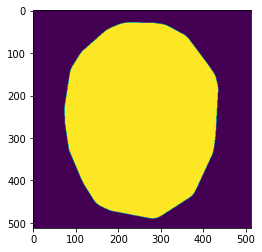

In [3]:
img0 = img[0]
img_ssos = np.linalg.norm(img, axis=0).astype(np.complex64)

mask = img_ssos > np.percentile(img_ssos[:], 99.7)
mask = convex_hull_image(mask)
mask = dilation(mask, disk(32))
plt.imshow(mask)

In [4]:
import pycuda.autoinit
fourier_op = MRICufi(samples_cufi, shape, eps=1e-3, density=True)

In [5]:
k0 = fourier_op.op(img_ssos)
print(type(k0), k0.dtype, k0.shape)

<class 'pycuda.gpuarray.GPUArray'> complex64 (32768,)


In [6]:
img_new = fourier_op.adj_op(k0)

In [7]:
def radial_traj(img_width,AF): 
    nb_shots = img_width//AF
    n_shots = np.arange(0, nb_shots)
    n_samples = (np.arange(0,img_width) - img_width//2)/img_width
    shot_c = np.array(n_samples, dtype = np.complex64)
    shots = np.array([], dtype = np.complex64)    
    # acculumate shots after rotating the initial one by the right angular increment        
    for k in n_shots:
        shots = np.append(shots, shot_c * np.exp(2 * np.pi * 1j * k/(2*nb_shots)))

    kspace_loc = np.zeros((len(shots),2))
    #assign real and imaginary parts of complex-valued k-space trajectories to k-space locations
    kspace_loc[:,0] = shots.real
    kspace_loc[:,1] = shots.imag
    return kspace_loc

In [8]:
def precision_plot(AF, img_ssos, eps_list, density=True,mask=None):
    samples = radial_traj(img_ssos.shape[0], AF)
    t_init = perf_counter()
    density_compensation_gpuNUFFT = estimate_density_compensation(samples, shape) if density else None
    gpuNUFFT = NonCartesianFFT(samples, shape, n_coils=1, implementation="gpuNUFFT", density_comp=density_compensation_gpuNUFFT)
    t_s = perf_counter()
    img_gpuNUFFT = gpuNUFFT.adj_op(gpuNUFFT.op(img_ssos))
    t_f = perf_counter()
    img_cufi = []
    times = [(0, 0), (t_s-t_init, t_f-t_s)] 
    d_c = "$d_{c}·$" if density else ""
    for eps in eps_list: 
        samples_cufi = radial_traj(img_ssos.shape[0], AF).astype(np.float32)
        samples_cufi *= np.pi/ samples_cufi.max()
        t_init = perf_counter()
        fourier_op = MRICufi(samples_cufi, shape, eps=eps, density=density)
        t_s = perf_counter()
        img = fourier_op.adj_op(fourier_op.op(img_ssos))
        t_f = perf_counter()
        times.append((t_s-t_init, t_f-t_s))
        img_cufi.append(np.copy(img))
        del fourier_op
    fig, axs = plt.subplots(2, 2+len(eps_list), figsize=(8*(2+len(eps_list)),7*2),facecolor='w')    
    for ax, data, title, time in zip(axs[0], [img_ssos, img_gpuNUFFT, *img_cufi], 
                               ["GroundTruth",
                               f"|g*({d_c}g(x))|",
                               *[(fr"$\varepsilon$={eps:.0e}" f"\n|c*({d_c}c(x))|") for eps in eps_list]],
                              times):
        im = ax.imshow(abs(data))
        fig.colorbar(im, ax=ax)
        ax.set_title(title + f"\n Init={smart_time(time[0])}, Run={smart_time(time[1])}",size=20)
        
    for ax, data, title in zip(axs[1][1:], [img_gpuNUFFT*np.pi**2, *img_cufi], 
                               [f"|x| - |g*({d_c}g(x))|"] + [fr"|x| - |c*({d_c}c(x))|" for eps in eps_list]):
        
        im = ax.imshow(normalized(abs(img_ssos)) - normalized(abs(data)))
        if mask is not None:
            psnr = 20 * np.log10(np.max(normalized(abs(img_ssos[mask])))/(np.sqrt(np.mean((normalized(abs(img_ssos[mask])) - normalized(abs(data[mask])))**2))))
            s = ssim(normalized(abs(img_ssos)*mask), normalized(abs(data)*mask))
        else:
            psnr = 20 * np.log10(np.max(normalized(abs(img_ssos)))/(np.sqrt(np.mean((normalized(abs(img_ssos)) - normalized(abs(data)))**2))))
            s = ssim(normalized(abs(img_ssos)), normalized(abs(data)))
        ax.set_title(title + f"\n PNSR= {psnr:.2f} dB, SSIM={s:.3f}",size=20)
        fig.colorbar(im,ax=ax)
        
    axs[1][0].scatter(samples[:,0], samples[:,1],s=0.1)
    axs[1][0].set_title(fr"sampling pattern AF={AF}," r"$\frac{NUpts}{Upts}$=" f"{len(samples)/img_ssos.size:.2f}",size=20)

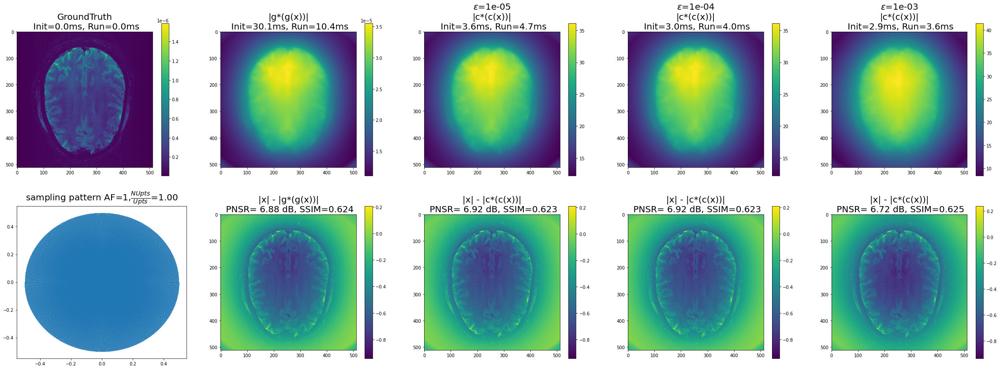

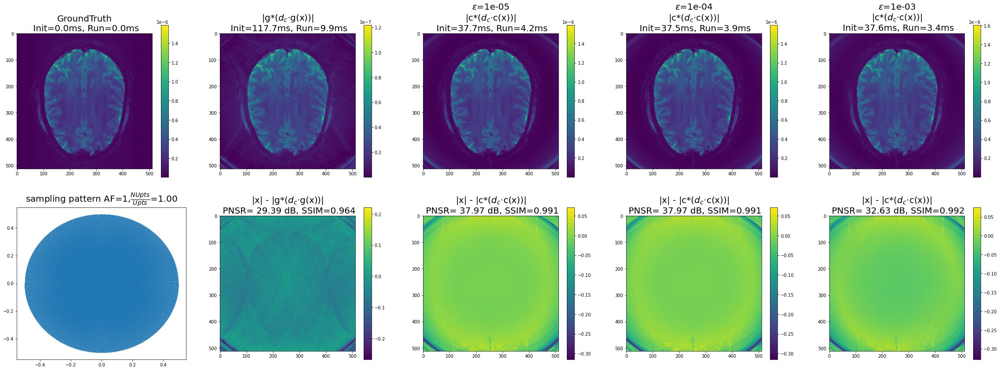

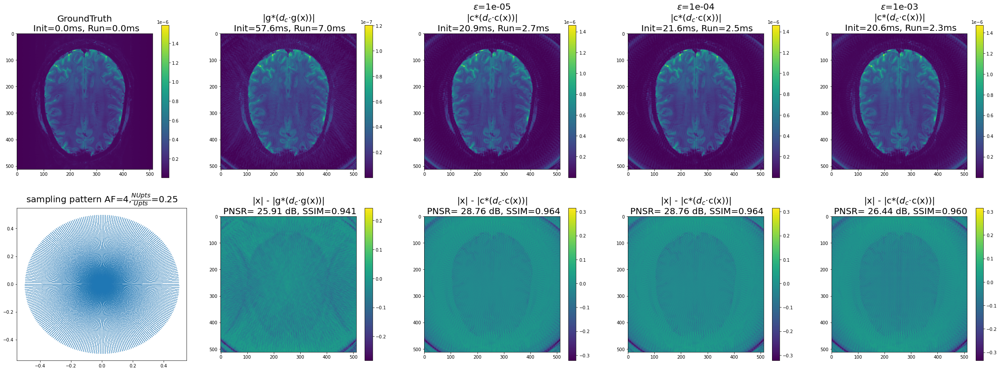

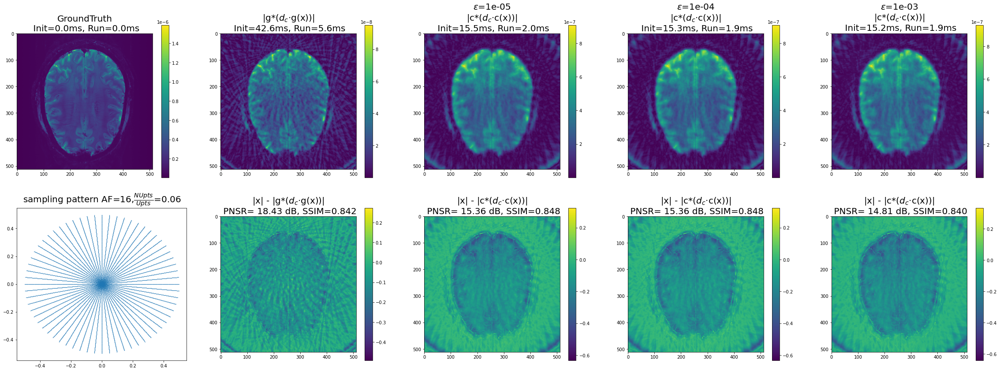

In [9]:
precision_plot(1, img_ssos, eps_list, density=False,mask=mask)
precision_plot(1, img_ssos, eps_list, density=True,mask=mask)
precision_plot(4, img_ssos, eps_list, density=True,mask=mask)
precision_plot(16, img_ssos, eps_list, density=True,mask=mask)

Text(0.5, 1.0, 'cufinufft first shot')

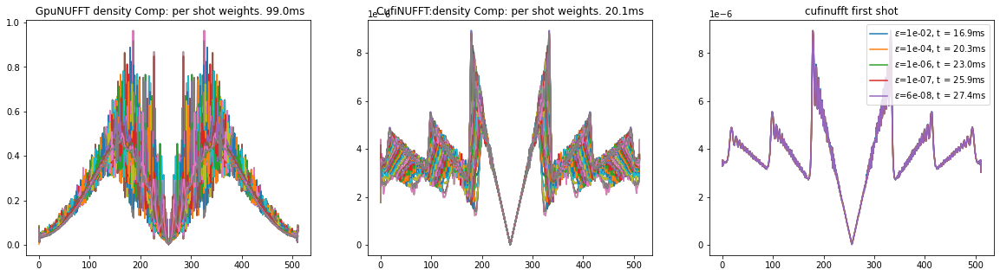

In [10]:
samples = radial_traj(512, 4).astype(np.float32)
samples_cufi = samples * np.pi/samples.max()
ts = perf_counter()
d_g = estimate_density_compensation(samples, shape,num_iterations=20)
tf = perf_counter()
n_samples_per_shot = 512
plt.figure(figsize=(20,5))
plt.subplot(131)
for i in range(512//4):
    plt.plot(d_g[i*n_samples_per_shot:(i+1)*n_samples_per_shot], label='gpuNUFFT')
    plt.title(' GpuNUFFT density Comp: per shot weights. '+f'{smart_time(tf-ts)}') 
ts = perf_counter()
d_c =  MRICufi.estimate_density(samples_cufi, shape, n_iter=10).get()
tf = perf_counter()

plt.subplot(132)
for i in range(512//4):
    plt.plot(d_c[i*n_samples_per_shot:(i+1)*n_samples_per_shot], label='cufiNUFFT')
    plt.title('CufiNUFFT:density Comp: per shot weights. '+f'{smart_time(tf-ts)}') 

plt.subplot(133)
eps_list = [1e-2, 1e-4, 1e-6,  1e-7, 6e-8]
for eps in eps_list:
    ts = perf_counter()
    d_c =  MRICufi.estimate_density(samples_cufi, shape, n_iter=10, eps=eps).get()
    tf = perf_counter()
    plt.plot(d_c[:n_samples_per_shot], label=r'$\varepsilon$='+f'{eps:.0e}, t = {smart_time(tf-ts)}')
    plt.legend()
plt.title('cufinufft first shot')

In [11]:
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

def performance_vs_precision(AF_list, eps_list, img_ssos, density=True, mask=None):
    fig, axs = plt.subplots(1,3, figsize=(15,5), facecolor='w')
    
    for AF, c in zip(AF_list,mcolors.TABLEAU_COLORS.keys()):
        samples = radial_traj(img_ssos.shape[0], AF)
        density_compensation_gpuNUFFT = estimate_density_compensation(samples, shape) if density else None
        gpuNUFFT = NonCartesianFFT(samples, shape, n_coils=1, implementation="gpuNUFFT", density_comp=density_compensation_gpuNUFFT)
        t_s = perf_counter()
        data = gpuNUFFT.adj_op(gpuNUFFT.op(img_ssos))
        t_f = perf_counter()
        times = [(t_f-t_s)*1000] 
        psnrs = [20 * np.log10(np.max(normalized(abs(img_ssos)))/(np.sqrt(np.mean((normalized(abs(img_ssos)) - normalized(abs(data)))**2))))]
        ssims = [ssim(normalized(abs(img_ssos)), normalized(abs(data)))]
        del gpuNUFFT 
        for eps in eps_list: 
            samples_cufi = radial_traj(img_ssos.shape[0], AF).astype(np.float32)
            samples_cufi *= np.pi/ samples_cufi.max()
            fourier_op = MRICufi(samples_cufi, shape, eps=eps, density=density)
            t_s = perf_counter()
            data = fourier_op.adj_op(fourier_op.op(img_ssos))
            t_f = perf_counter()
            times.append((t_f-t_s)*1000)
            if mask is not None:
                psnrs.append(20 * np.log10(np.max(normalized(abs(img_ssos[mask])))/(np.sqrt(np.mean((normalized(abs(img_ssos[mask])) - normalized(abs(data[mask])))**2)))))
                ssims.append(ssim(normalized(abs(img_ssos)*mask), normalized(abs(data)*mask)))
            else:
                psnrs.append(20 * np.log10(np.max(normalized(abs(img_ssos)))/(np.sqrt(np.mean((normalized(abs(img_ssos)) - normalized(abs(data)))**2)))))
                ssims.append(ssim(normalized(abs(img_ssos)), normalized(abs(data))))
            del fourier_op
        for ax, val, title in zip(axs, (times, psnrs, ssims), ("time (ms)", "psnr", "ssim")):
            ax.semilogx(eps_list, val[1:], color=c, label=f"AF={AF}")  
            ax.semilogx(eps_list[0:2] ,[val[0], val[0]] , linestyle= '--',  color=c)        
            ax.set_title(title)    
            ax.set_xlabel(r"$\varepsilon$")
    lines, labels = ax.get_legend_handles_labels()
    lines.append(Line2D([0],[0], color='k', linestyle='--', label="gpuNUFFT"))
    lines.append(Line2D([0],[0], color='k', linestyle='-', label="cufiNUFFT"))
    labels += ["gpuNUFFT","cufiNUFFT"]
    fig.legend(lines, labels, loc="center right")


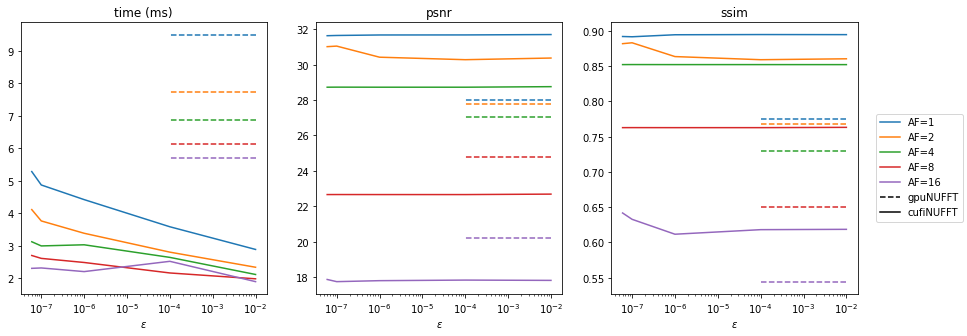

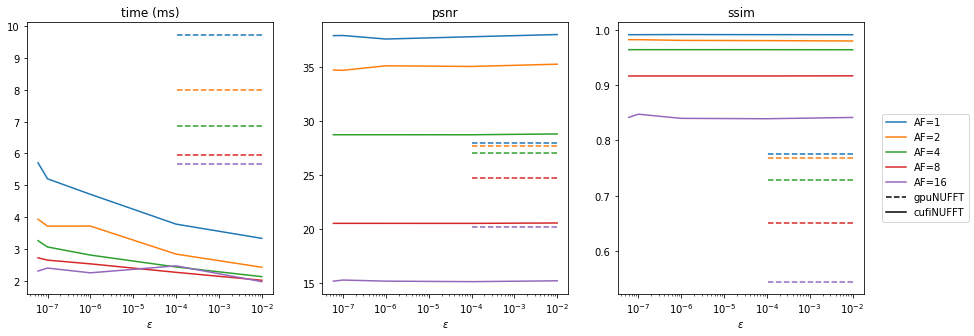

In [12]:
performance_vs_precision([1,2,4,8,16] , [1e-2, 1e-4, 1e-6, 1e-7,  6e-8], img_ssos)
performance_vs_precision([1,2,4,8,16] , [1e-2, 1e-4, 1e-6, 1e-7,  6e-8], img_ssos, mask=mask)

# 3D Dataset

In [13]:
from cufinufft_mri.operator import MRICufi
import pycuda.driver as cuda
import pycuda.gpuarray as pg
import numpy as np
import matplotlib.pyplot as plt
from pysap.data import get_sample_data
from skimage.morphology import convex_hull_image
from mri.operators.fourier.non_cartesian import NonCartesianFFT
from mri.operators.fourier.utils import estimate_density_compensation, normalize_frequency_locations
from time import perf_counter
from modopt.math.metrics import ssim


def smart_time(t):
    if t < 1.0:
        return f"{t*1000:3.1f}ms"
    return f"{t:2.1f}s"

def normalized(array):
    #return array/np.linalg.norm(array)
    m = np.mean(array)
    return (array-m) /np.max(array-m)

In [14]:
img3d = get_sample_data("3d-pmri").data.astype(np.complex64)

shape3d = (128,128,160)
img3d0 = img3d[0]
img3d_ssos = np.linalg.norm(img3d, axis=0).astype(np.complex64).copy(order="C")

print(img3d_ssos.shape)

The history saving thread hit an unexpected error (OperationalError('disk I/O error')).History will not be written to the database.
(128, 128, 160)


In [16]:
def complex_to_2d(points):
    X = points.real
    Y = points.imag
    return np.asarray([X, Y]).T
from scipy.spatial.transform import Rotation as Rot

def init_radial_traj(num_samples, num_shots, dimension,
                              initialization, num_shots_z=None, **kwargs):
    k_shots = []
    shot = np.arange(0, num_samples, dtype=np.complex64)
    if initialization == 'RadialIO':
        k_TE = num_samples // 2
        shot = (-1 * shot / k_TE + 1) * \
               (1 / (2 * np.pi)) * (1 - np.finfo(float).eps)
        theta = np.pi / num_shots
    else:
        shot = shot / (num_samples - 1) * \
               1 / (2 * np.pi) * (1 - np.finfo(float).eps)
        theta = 2 * np.pi / num_shots
        # Rotate shot in xy plane
    for k in np.arange(num_shots):
        angle_xy = k * theta + theta / 2
        rotated_shot = shot * np.exp(1j * (angle_xy))
        if dimension == 3:
            if num_shots_z is None:
                num_shots_z = num_shots
            shot2d = complex_to_2d(rotated_shot)
            shot3d = np.zeros(
                (*shot2d.shape[0:-1], shot2d.shape[-1] + 1)
            )
            shot3d[:, 0:2] = shot2d
            for j in np.arange(num_shots_z):
                angle_z = theta / 2 + j * theta
                C = np.cos(angle_z / 2)
                S = np.sin(angle_z / 2)
                r = Rot.from_quat(
                    [C, - np.sin(angle_xy) * S,
                     np.cos(angle_xy) * S, 0])
                k_shots.append(r.apply(shot3d))
        else:
            k_shots.append(complex_to_2d(rotated_shot))
    k_shots = np.asarray(k_shots)
    k_shots = k_shots.reshape((np.prod(k_shots.shape[:2]), dimension))
    return k_shots


In [17]:
eps_list = [1e-2, 1e-3, 1e-4]


In [18]:
def precision_plot3d(AF, NS, img_ssos, eps_list,density=True):
    samples3d = init_radial_traj(num_samples=NS, num_shots=int(128/np.sqrt(AF)), dimension=3, initialization="", num_shot_z=int(160/np.sqrt(AF))).copy(order='F')
    t_init = perf_counter()
    density_compensation_gpuNUFFT = estimate_density_compensation(samples3d, shape3d)  if density else None
    gpuNUFFT = NonCartesianFFT(samples3d, shape3d, n_coils=1, implementation="gpuNUFFT", density_comp=density_compensation_gpuNUFFT)
    print("gpuNUFFT")
    t_s = perf_counter()
    img_gpuNUFFT = gpuNUFFT.adj_op(gpuNUFFT.op(img_ssos))
    t_f = perf_counter()
    del gpuNUFFT
    img_cufi = []
    times = [(0, 0), (t_s-t_init, t_f-t_s)] 
    for eps in eps_list: 
        print(eps)
        samples3d = init_radial_traj(num_samples=NS, num_shots=int(128/np.sqrt(AF)), dimension=3, initialization="", num_shot_z=int(160/np.sqrt(AF))).astype(np.float32)
        samples3d *= 2 * np.pi ** 2
        t_init = perf_counter()
        density = MRICufi.estimate_density(samples3d, shape3d, eps=eps, n_iter=10)
        fourier_op = MRICufi(samples3d, shape3d, eps=eps, density=density)
        t_s = perf_counter()
        img = fourier_op.adj_op(fourier_op.op(img_ssos))
        t_f = perf_counter()
        times.append((t_s-t_init, t_f-t_s))
        img_cufi.append(np.copy(img))
        del fourier_op
    print("done")
    fig = plt.figure(figsize=(8*(2+len(eps_list)),7*2),facecolor='w')
    axs = fig.subplots(2, 2+len(eps_list))    
    for ax, data, title, time in zip(axs[0], [img_ssos, img_gpuNUFFT, *img_cufi], 
                               ["GroundTruth",
                               "|g*(g(x))|",
                               *[fr"$\varepsilon$={eps:.0e} |c*(c(x))|" for eps in eps_list]],
                              times):
        im = ax.imshow(abs(data)[...,80])
        fig.colorbar(im, ax=ax)
        ax.set_title(title + f"\n Init={smart_time(time[0])}, Run={smart_time(time[1])}",size=20)
        
    for ax, data, title in zip(axs[1][1:], [img_gpuNUFFT, *img_cufi], 
                               ["|g*(g(x))|"] + [fr"$\varepsilon$={eps:.0e} |c*(c(x))|" for eps in eps_list]):
        
        im = ax.imshow(normalized(abs(img_ssos[:,:,80])) - normalized(abs(data[:,:,80])))
        psnr = 20 * np.log10(np.max(normalized(abs(img_ssos[:,:,80])))/(np.sqrt(np.mean((normalized(abs(img_ssos[:,:,80])) - normalized(abs(data[:,:,80])))**2))))
        s = ssim(normalized(abs(img_ssos)), normalized(abs(data)))
        ax.set_title(title + f"\n PNSR= {psnr:.2f} dB, SSIM={s:.3f}",size=20)
        fig.colorbar(im,ax=ax)
    axs[1][0].axis('off')
    axs[1][0].text(0.1,0.5, f"AF={AF}\n" f"samples/shots={NS}\n" f"shots={len(samples3d)//NS}\n" "$\\dfrac{NUpts}{Upts}$=" f"{len(samples3d)/img_ssos.size}", size=20)

gpuNUFFT
0.01
0.0001
1e-06
done
gpuNUFFT
0.01
0.0001
1e-06
done
gpuNUFFT
0.01
0.0001
1e-06
done


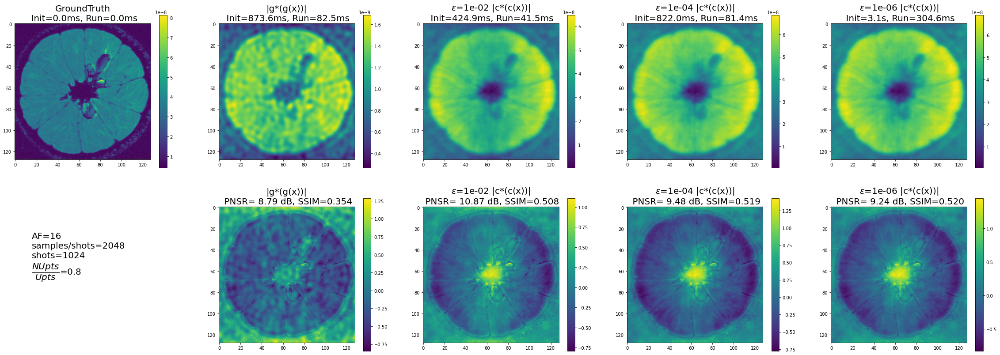

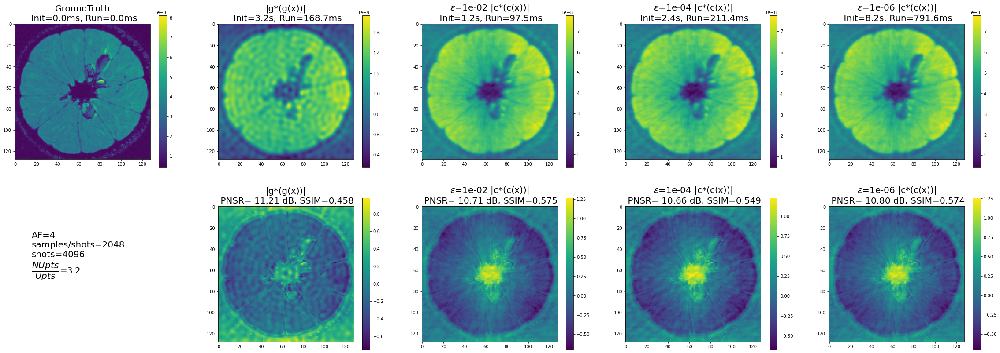

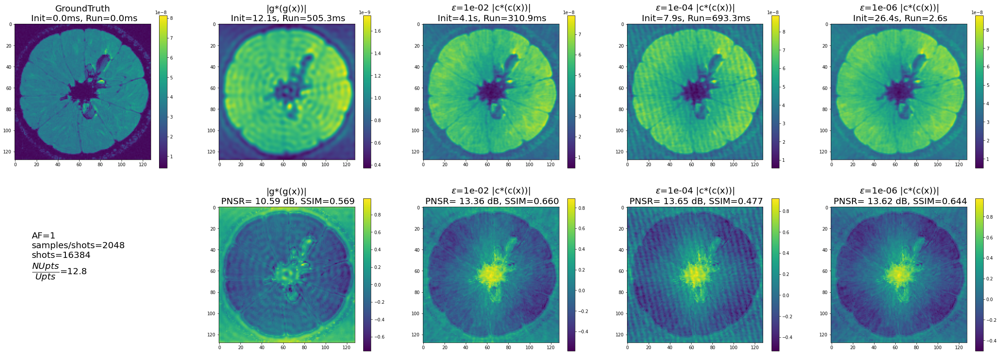

In [19]:
eps_list = [1e-2, 1e-4, 1e-6]
precision_plot3d(16, 2048, img3d_ssos, eps_list, density=True)
precision_plot3d(4, 2048, img3d_ssos, eps_list, density=True)
precision_plot3d(1, 2048, img3d_ssos, eps_list, density=True)

In [25]:
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

def performance_vs_precision3d(NS, AF_list, eps_list, img_ssos, density=True, mask=None):
    fig, axs = plt.subplots(1,3, figsize=(15,5), facecolor='w')
    
    for AF, c in zip(AF_list,mcolors.TABLEAU_COLORS.keys()):
        print(AF)
        samples3d = init_radial_traj(num_samples=NS, num_shots=int(128/np.sqrt(AF)), dimension=3, initialization="", num_shot_z=int(160/np.sqrt(AF))).copy(order='F')
        samples3d = samples3d.astype(np.float32)
        density_compensation_gpuNUFFT = estimate_density_compensation(samples3d, shape3d) if density else None
        gpuNUFFT = NonCartesianFFT(samples3d, shape3d, n_coils=1, implementation="gpuNUFFT", density_comp=density_compensation_gpuNUFFT)
        t_s = perf_counter()
        data = gpuNUFFT.adj_op(gpuNUFFT.op(img_ssos))
        t_f = perf_counter()
        times = [(t_f-t_s)] 
        psnrs = [20 * np.log10(np.max(normalized(abs(img_ssos)))/(np.sqrt(np.mean((normalized(abs(img_ssos)) - normalized(abs(data)))**2))))]
        ssims = [ssim(normalized(abs(img_ssos)), normalized(abs(data)))]
        del gpuNUFFT 
        for eps in eps_list: 
            samples3d = init_radial_traj(num_samples=NS, num_shots=int(128/np.sqrt(AF)), dimension=3, initialization="", num_shot_z=int(160/np.sqrt(AF))).astype(np.float32)
            samples3d *= 2 * np.pi ** 2
            density = MRICufi.estimate_density(samples3d, shape3d, eps=eps, n_iter=10) if density else False
            fourier_op = MRICufi(samples3d, shape3d, eps=eps, density=density)
            t_s = perf_counter()
            data = fourier_op.adj_op(fourier_op.op(img_ssos))
            t_f = perf_counter()
            times.append((t_f-t_s))
            if mask is not None:
                psnrs.append(20 * np.log10(np.max(normalized(abs(img_ssos[mask])))/(np.sqrt(np.mean((normalized(abs(img_ssos[mask])) - normalized(abs(data[mask])))**2)))))
                ssims.append(ssim(normalized(abs(img_ssos)*mask), normalized(abs(data)*mask)))
            else:
                psnrs.append(20 * np.log10(np.max(normalized(abs(img_ssos)))/(np.sqrt(np.mean((normalized(abs(img_ssos)) - normalized(abs(data)))**2)))))
                ssims.append(ssim(normalized(abs(img_ssos)), normalized(abs(data))))
            del fourier_op
        for ax, val, title in zip(axs, (times, psnrs, ssims), ("time (s)", "psnr", "ssim")):
            ax.semilogx(eps_list, val[1:], color=c, label=f"AF={AF}\n"+fr"$\rho=${len(samples3d)/np.prod(img_ssos.shape):.2f}")  
            ax.semilogx(eps_list[0:2] ,[val[0], val[0]] , linestyle= '--',  color=c)        
            ax.set_title(title)    
            ax.set_xlabel(r"$\varepsilon$")
    lines, labels = ax.get_legend_handles_labels()
    lines.append(Line2D([0],[0], color='k', linestyle='--', label="gpuNUFFT"))
    lines.append(Line2D([0],[0], color='k', linestyle='-', label="cufiNUFFT"))
    labels += ["gpuNUFFT","cufiNUFFT"]
    fig.legend(lines, labels, loc="center right")

0.5
1
2
4
8
16
0.5
1
2
4
8
16
0.5
1
2
4
8
16


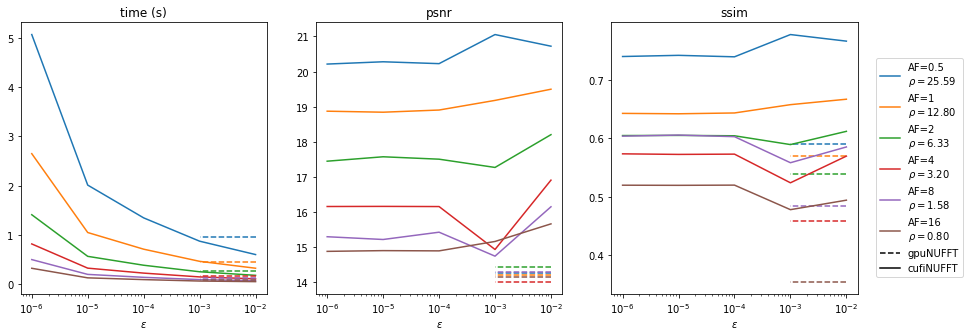

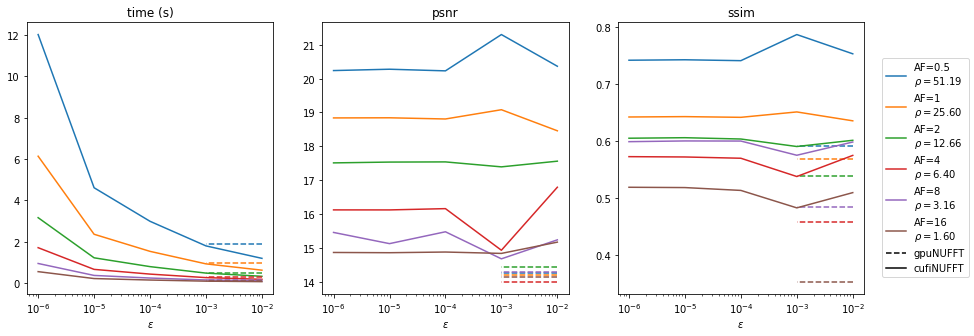

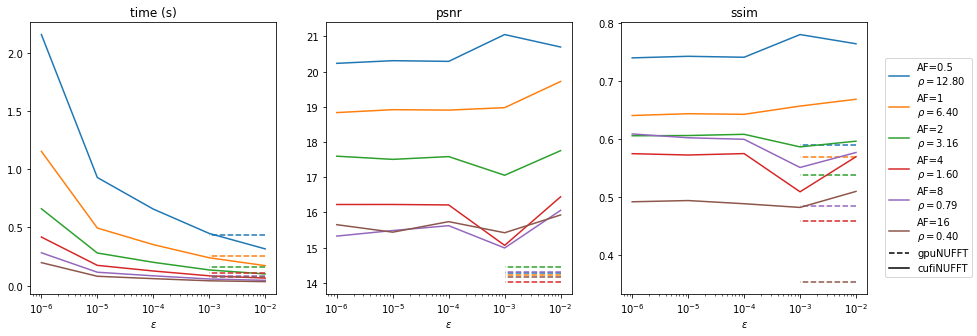

In [26]:
performance_vs_precision3d(2048, [0.5, 1, 2, 4, 8, 16,] , [1e-2, 1e-3, 1e-4, 1e-5, 1e-6], img3d_ssos, density=True, mask=None)
performance_vs_precision3d(4096, [0.5, 1, 2, 4, 8, 16,] , [1e-2, 1e-3, 1e-4, 1e-5, 1e-6], img3d_ssos, density=True, mask=None)
performance_vs_precision3d(1024, [0.5, 1, 2, 4, 8, 16,] , [1e-2, 1e-3, 1e-4, 1e-5, 1e-6], img3d_ssos, density=True, mask=None)

In [22]:
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

def performance_vs_precision3d2(NS_list, AF, eps_list, img_ssos, density=True, mask=None):
    fig, axs = plt.subplots(3,1, figsize=(10,20), facecolor='w')
    
    for NS, c in zip(NS_list,mcolors.TABLEAU_COLORS.keys()):
        print(AF)
        samples3d = init_radial_traj(num_samples=NS, num_shots=int(128/np.sqrt(AF)), dimension=3, initialization="", num_shot_z=int(160/np.sqrt(AF))).copy(order='F')
        samples3d = samples3d.astype(np.float32)
        density_compensation_gpuNUFFT = estimate_density_compensation(samples3d, shape3d) if density else None
        gpuNUFFT = NonCartesianFFT(samples3d, shape3d, n_coils=1, implementation="gpuNUFFT", density_comp=density_compensation_gpuNUFFT)
        t_s = perf_counter()
        data = gpuNUFFT.adj_op(gpuNUFFT.op(img_ssos))
        t_f = perf_counter()
        times = [(t_f-t_s)] 
        psnrs = [20 * np.log10(np.max(normalized(abs(img_ssos)))/(np.sqrt(np.mean((normalized(abs(img_ssos)) - normalized(abs(data)))**2))))]
        ssims = [ssim(normalized(abs(img_ssos)), normalized(abs(data)))]
        del gpuNUFFT 
        for eps in eps_list: 
            samples3d = init_radial_traj(num_samples=NS, num_shots=int(128/np.sqrt(AF)), dimension=3, initialization="", num_shot_z=int(160/np.sqrt(AF))).astype(np.float32)
            samples3d *= 2 * np.pi ** 2
            density = MRICufi.estimate_density(samples3d, shape3d, eps=eps, n_iter=10) if density else False
            fourier_op = MRICufi(samples3d, shape3d, eps=eps, density=density)
            t_s = perf_counter()
            data = fourier_op.adj_op(fourier_op.op(img_ssos))
            t_f = perf_counter()
            times.append((t_f-t_s))
            if mask is not None:
                psnrs.append(20 * np.log10(np.max(normalized(abs(img_ssos[mask])))/(np.sqrt(np.mean((normalized(abs(img_ssos[mask])) - normalized(abs(data[mask])))**2)))))
                ssims.append(ssim(normalized(abs(img_ssos)*mask), normalized(abs(data)*mask)))
            else:
                psnrs.append(20 * np.log10(np.max(normalized(abs(img_ssos)))/(np.sqrt(np.mean((normalized(abs(img_ssos)) - normalized(abs(data)))**2)))))
                ssims.append(ssim(normalized(abs(img_ssos)), normalized(abs(data))))
            del fourier_op
        for ax, val, title in zip(axs, (times, psnrs, ssims), ("time (s)", "psnr", "ssim")):
            ax.semilogx(eps_list, val[1:], color=c, label=f"NS={NS}")  
            ax.semilogx(eps_list[0:3] ,[val[0], val[0]] , linestyle= '--',  color=c)        
            ax.set_title(title)    
            ax.set_xlabel(r"$\varepsilon$")
    lines, labels = ax.get_legend_handles_labels()
    lines.insert(0,Line2D([0],[0], color='k', linestyle='--', label="gpuNUFFT"))
    lines.insert(1,Line2D([0],[0], color='k', linestyle='-', label="cufiNUFFT"))
    lines.insert(2,Line2D([0],[0], color='white', linestyle='-', label=""))

    labels = ["gpuNUFFT","cufiNUFFT", ""] + labels
    fig.legend(lines, labels, loc="lower center",ncol=3)

# 2D Sparkling MRI data

In [23]:
def precision_plot_sparkling(samples, Nc, img_ssos, eps_list, density=True,mask=None):
    t_init = perf_counter()
    density_compensation_gpuNUFFT = estimate_density_compensation(samples, shape) if density else None
    gpuNUFFT = NonCartesianFFT(samples, shape, n_coils=1, implementation="gpuNUFFT", density_comp=density_compensation_gpuNUFFT)
    t_s = perf_counter()
    img_gpuNUFFT = gpuNUFFT.adj_op(gpuNUFFT.op(img_ssos))
    t_f = perf_counter()
    img_cufi = []
    times = [(0, 0), (t_s-t_init, t_f-t_s)] 
    d_c = "$d_{c}·$" if density else ""
    for eps in eps_list: 
        samples_cufi = samples.copy(order="C")
        samples_cufi *= np.pi/ samples_cufi.max()
        t_init = perf_counter()
        fourier_op = MRICufi(samples_cufi, shape, eps=eps, density=density)
        t_s = perf_counter()
        img = fourier_op.adj_op(fourier_op.op(img_ssos))
        t_f = perf_counter()
        times.append((t_s-t_init, t_f-t_s))
        img_cufi.append(np.copy(img))
        del fourier_op
    fig, axs = plt.subplots(2, 2+len(eps_list), figsize=(8*(2+len(eps_list)),7*2),facecolor='w')    
    for ax, data, title, time in zip(axs[0], [img_ssos, img_gpuNUFFT, *img_cufi], 
                               ["GroundTruth",
                               f"|g*({d_c}g(x))|",
                               *[(fr"$\varepsilon$={eps:.0e}" f"\n|c*({d_c}c(x))|") for eps in eps_list]],
                              times):
        im = ax.imshow(abs(data))
        fig.colorbar(im, ax=ax)
        ax.set_title(title + f"\n Init={smart_time(time[0])}, Run={smart_time(time[1])}",size=20)
        
    for ax, data, title in zip(axs[1][1:], [img_gpuNUFFT*np.pi**2, *img_cufi], 
                               [f"|x| - |g*({d_c}g(x))|"] + [fr"|x| - |c*({d_c}c(x))|" for eps in eps_list]):
        
        im = ax.imshow(normalized(abs(img_ssos)) - normalized(abs(data)))
        if mask is not None:
            psnr = 20 * np.log10(np.max(normalized(abs(img_ssos[mask])))/(np.sqrt(np.mean((normalized(abs(img_ssos[mask])) - normalized(abs(data[mask])))**2))))
            s = ssim(normalized(abs(img_ssos)*mask), normalized(abs(data)*mask))
        else:
            psnr = 20 * np.log10(np.max(normalized(abs(img_ssos)))/(np.sqrt(np.mean((normalized(abs(img_ssos)) - normalized(abs(data)))**2))))
            s = ssim(normalized(abs(img_ssos)), normalized(abs(data)))
        ax.set_title(title + f"\n PNSR= {psnr:.2f} dB, SSIM={s:.3f}",size=20)
        fig.colorbar(im,ax=ax)
    Ns = len(samples)//Nc
    for i in range(Nc):
        axs[1][0].scatter(samples[i*Ns:i*Ns+Ns,0], samples[i*Ns:i*Ns+Ns,1],s=0.1)
    axs[1][0].set_title(fr"sampling pattern Nc={Nc}," r"$\frac{NUpts}{Upts}$=" f"{len(samples)/img_ssos.size:.2f}",size=20)

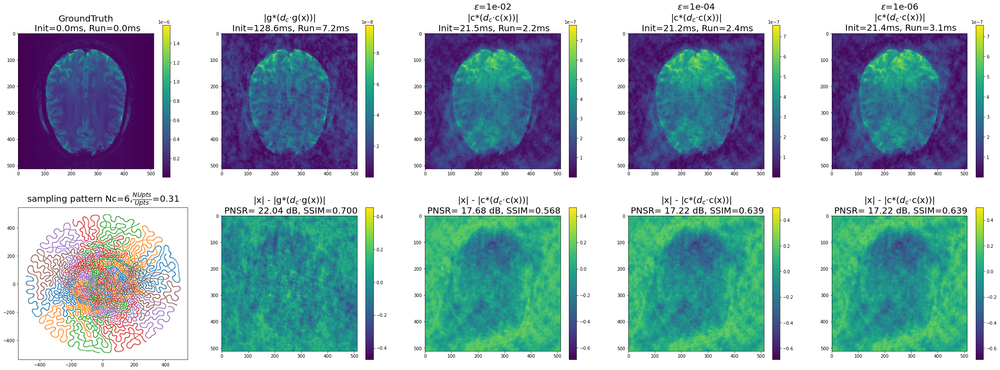

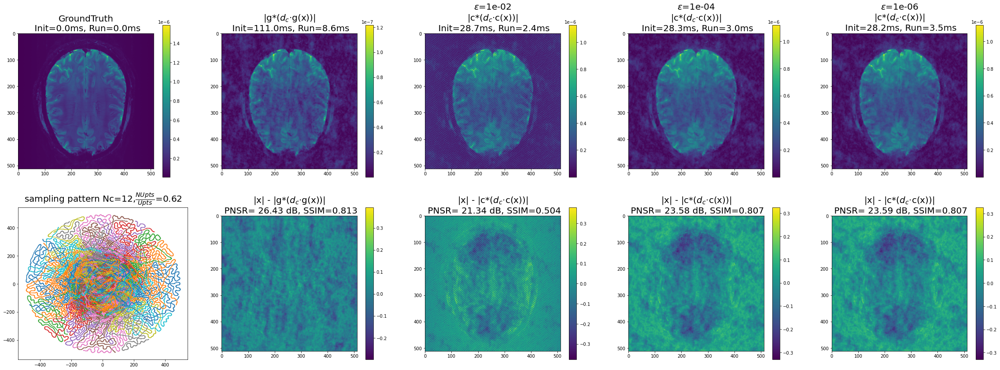

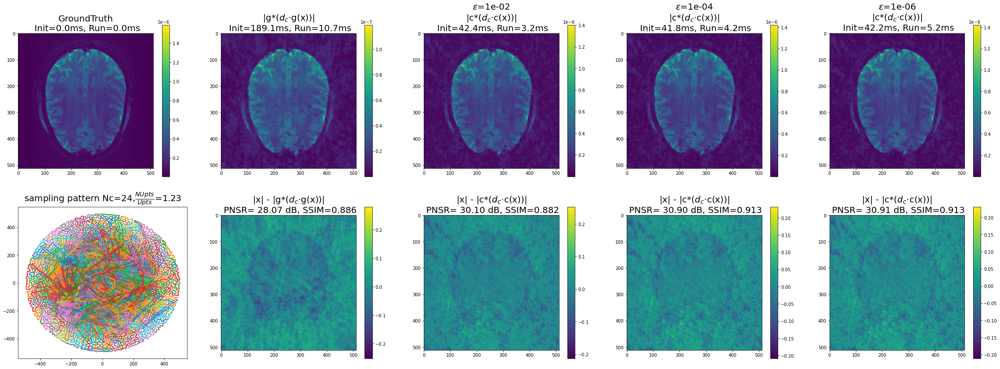

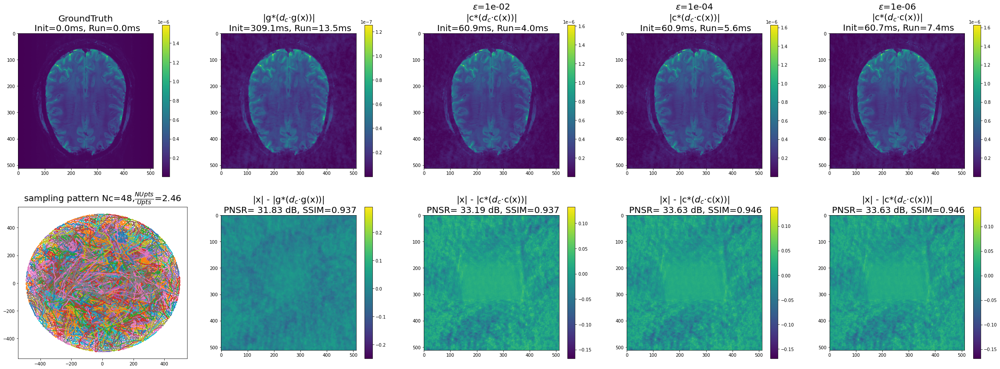

In [31]:
for Nc in [6,12, 24, 48]:
    sp = np.load(f"../Sparkling2d_Nc{Nc}.npy")
    precision_plot_sparkling(sp, Nc, img_ssos, eps_list, density=True,mask=True)

In [34]:
def performance_vs_precision_sparkling(Nc_list, eps_list, img_ssos, density=True, mask=None):
    fig, axs = plt.subplots(1,3, figsize=(15,5), facecolor='w')
    
    for Nc, c in zip(Nc_list,mcolors.TABLEAU_COLORS.keys()):
        samples = np.load(f"../Sparkling2d_Nc{Nc}.npy").astype(np.float32)
        density_compensation_gpuNUFFT = estimate_density_compensation(samples, shape) if density else None
        gpuNUFFT = NonCartesianFFT(samples, shape, n_coils=1, implementation="gpuNUFFT", density_comp=density_compensation_gpuNUFFT)
        t_s = perf_counter()
        data = gpuNUFFT.adj_op(gpuNUFFT.op(img_ssos))
        t_f = perf_counter()
        times = [(t_f-t_s)*1000] 
        psnrs = [20 * np.log10(np.max(normalized(abs(img_ssos)))/(np.sqrt(np.mean((normalized(abs(img_ssos)) - normalized(abs(data)))**2))))]
        ssims = [ssim(normalized(abs(img_ssos)), normalized(abs(data)))]
        del gpuNUFFT 
        for eps in eps_list: 
            samples_cufi = np.load(f"../Sparkling2d_Nc{Nc}.npy").copy(order="C").astype(np.float32)
            samples_cufi *= np.pi/ samples_cufi.max()
            fourier_op = MRICufi(samples_cufi, shape, eps=eps, density=density)
            t_s = perf_counter()
            data = fourier_op.adj_op(fourier_op.op(img_ssos))
            t_f = perf_counter()
            times.append((t_f-t_s)*1000)
            if mask is not None:
                psnrs.append(20 * np.log10(np.max(normalized(abs(img_ssos[mask])))/(np.sqrt(np.mean((normalized(abs(img_ssos[mask])) - normalized(abs(data[mask])))**2)))))
                ssims.append(ssim(normalized(abs(img_ssos)*mask), normalized(abs(data)*mask)))
            else:
                psnrs.append(20 * np.log10(np.max(normalized(abs(img_ssos)))/(np.sqrt(np.mean((normalized(abs(img_ssos)) - normalized(abs(data)))**2)))))
                ssims.append(ssim(normalized(abs(img_ssos)), normalized(abs(data))))
            del fourier_op
        for ax, val, title in zip(axs, (times, psnrs, ssims), ("time (ms)", "psnr", "ssim")):
            ax.semilogx(eps_list, val[1:], color=c, label=f"Nc={Nc}\n"+fr"$\rho$={len(samples)/img_ssos.size:.2f}")  
            ax.semilogx(eps_list[0:2] ,[val[0], val[0]] , linestyle= '--',  color=c)        
            ax.set_title(title)    
            ax.set_xlabel(r"$\varepsilon$")
    lines, labels = ax.get_legend_handles_labels()
    lines.append(Line2D([0],[0], color='k', linestyle='--', label="gpuNUFFT"))
    lines.append(Line2D([0],[0], color='k', linestyle='-', label="cufiNUFFT"))
    labels += ["gpuNUFFT","cufiNUFFT"]
    fig.legend(lines, labels, loc="center right")


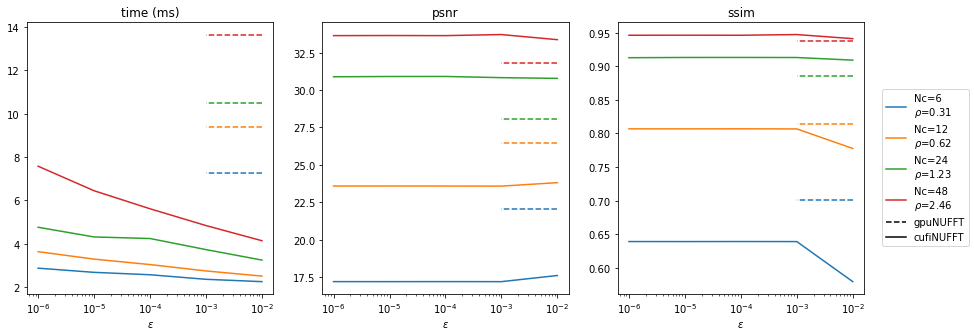

In [35]:
performance_vs_precision_sparkling([6,12,24,48],[1e-2, 1e-3, 1e-4, 1e-5, 1e-6], img_ssos, density=True, mask=True)